# Tugas 7: DETEKSI KOMUNITAS FACEBOOK GRAPH (Algoritma Louvain)

In [35]:
# %pip install python-louvain

In [36]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from collections import Counter

from community import community_louvain

## 1. LOAD DATA GRAPH FACEBOOK

In [37]:
FILE_PATH = "dataset/facebook_combined.txt"

# Graph tak berarah
G = nx.read_edgelist(
    FILE_PATH,
    nodetype=int,        # node berupa integer (0,1,2, dst)
    data=False           # hanya ada edge, tidak ada atribut lain
)

print("Jumlah node  :", G.number_of_nodes())
print("Jumlah edge  :", G.number_of_edges())


Jumlah node  : 4039
Jumlah edge  : 88234


## 2. DETEKSI KOMUNITAS: LOUVAIN

In [38]:
# partition adalah dictionary: {node: id_komunitas}
partition = community_louvain.best_partition(G)

# Tambahkan atribut komunitas ke setiap node (optional, tapi enak untuk analisis)
nx.set_node_attributes(G, partition, "community")

# Hitung modularitas
modularity_value = community_louvain.modularity(partition, G)
print("Modularity   :", modularity_value)

# Hitung jumlah komunitas
community_ids = list(partition.values())
num_communities = len(set(community_ids))
print("Jumlah komunitas:", num_communities)

# Ukuran tiap komunitas
community_sizes = Counter(community_ids)
print("\nUkuran masing-masing komunitas (community_id: size):")
for cid, size in community_sizes.most_common():
    print(f"Komunitas {cid}: {size} node")

Modularity   : 0.8349363331330566
Jumlah komunitas: 16

Ukuran masing-masing komunitas (community_id: size):
Komunitas 3: 548 node
Komunitas 2: 541 node
Komunitas 7: 435 node
Komunitas 1: 432 node
Komunitas 4: 423 node
Komunitas 0: 344 node
Komunitas 5: 326 node
Komunitas 10: 237 node
Komunitas 14: 226 node
Komunitas 13: 206 node
Komunitas 6: 125 node
Komunitas 9: 73 node
Komunitas 12: 60 node
Komunitas 11: 25 node
Komunitas 15: 19 node
Komunitas 8: 19 node


## 3. VISUALISASI GRAPH (SUBGRAPH)


Komunitas terbesar: 3 dengan 548 node
Node di subgraph visualisasi: 548
Edge di subgraph visualisasi: 5356


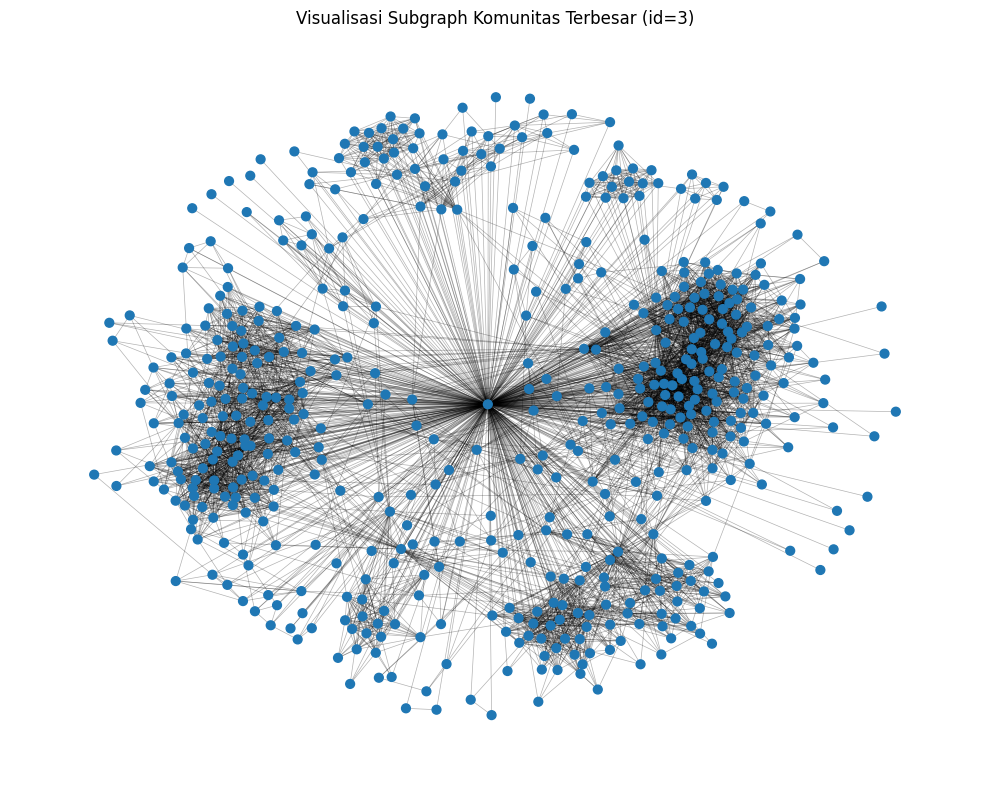

In [39]:

# Ambil ID komunitas terbesar
largest_community_id, largest_size = community_sizes.most_common(1)[0]
print("\nKomunitas terbesar:", largest_community_id, "dengan", largest_size, "node")

# Ambil semua node yang termasuk komunitas terbesar
nodes_in_largest = [n for n, c in partition.items() if c == largest_community_id]

# Kalau terlalu besar, sampling beberapa saja, misalnya max 300 node
MAX_NODES_TO_DRAW = 4039
if len(nodes_in_largest) > MAX_NODES_TO_DRAW:
    nodes_in_largest = nodes_in_largest[:MAX_NODES_TO_DRAW]

# Buat subgraph dari komunitas terbesar
H = G.subgraph(nodes_in_largest).copy()
print("Node di subgraph visualisasi:", H.number_of_nodes())
print("Edge di subgraph visualisasi:", H.number_of_edges())

# warna node berdasarkan ID komunitas (sebenarnya sama semua kalau hanya 1 komunitas,
# tapi kita bisa tetap pakai partition untuk generalisasi)
colors = [partition[n] for n in H.nodes()]

plt.figure(figsize=(10, 8))
pos = nx.spring_layout(H, seed=42, k=0.15)  # layout force-directed

nx.draw_networkx_nodes(H, pos,
                       node_size=40,
                       node_color=colors,
                       cmap=plt.cm.tab20)

nx.draw_networkx_edges(H, pos,
                       alpha=0.3,
                       width=0.5)

plt.title(f"Visualisasi Subgraph Komunitas Terbesar (id={largest_community_id})")
plt.axis("off")
plt.tight_layout()
plt.show()

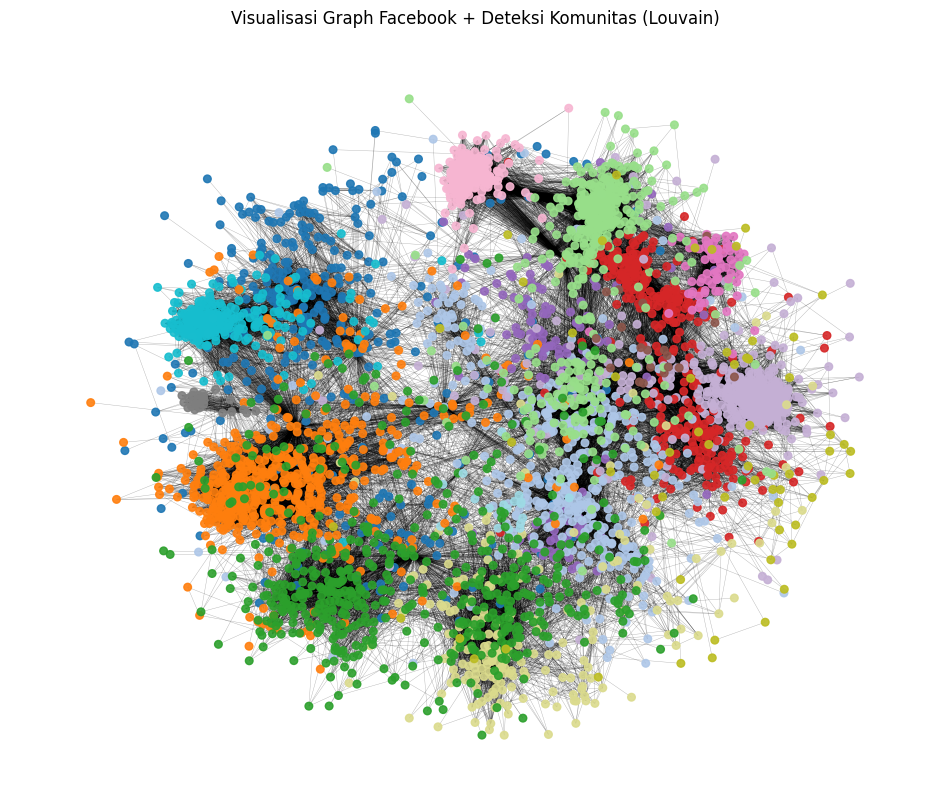

In [ ]:
import matplotlib.pyplot as plt
import networkx as nx

# --- Jika grafik terlalu besar, ambil sampel 500 node acak ---
MAX_NODES = 4039
if len(G.nodes()) > MAX_NODES:
    print(f"Graph terlalu besar ({len(G.nodes())} node), sampling {MAX_NODES} node...")
    nodes_sampled = list(G.nodes())[:MAX_NODES]   # atau random.sample untuk acak
    H = G.subgraph(nodes_sampled).copy()
else:
    H = G

# Warna per node sesuai komunitas
node_colors = [partition[n] for n in H.nodes()]

plt.figure(figsize=(12, 10))
pos = nx.spring_layout(H, seed=42, k=0.15)  # layout ala force-directed

nx.draw_networkx_nodes(
    H,
    pos,
    node_size=30,
    node_color=node_colors,
    cmap=plt.cm.tab20,
    alpha=0.9
)

nx.draw_networkx_edges(
    H,
    pos,
    width=0.3,
    alpha=0.3
)

plt.title("Visualisasi Graph Facebook + Deteksi Komunitas (Louvain)")
plt.axis("off")
plt.show()


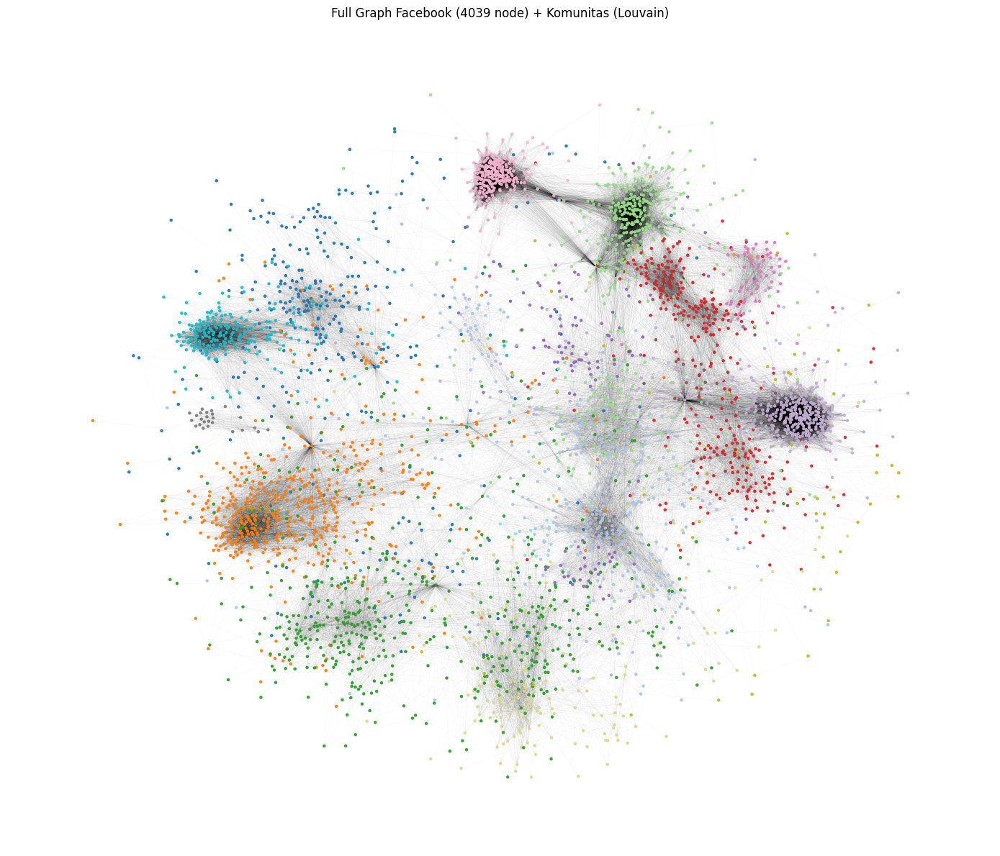

In [41]:
# Warna node berdasarkan komunitas
node_colors = [partition[n] for n in G.nodes()]

plt.figure(figsize=(14, 12))

# layout 2D untuk semua node
pos = nx.spring_layout(G, seed=42, k=0.15)  # ini yang mirip di PPT

# gambar node
nx.draw_networkx_nodes(
    G,
    pos,
    node_size=5,                # kecil banget biar nggak pecah
    node_color=node_colors,
    cmap=plt.cm.tab20,
    alpha=0.9
)

# gambar edge
nx.draw_networkx_edges(
    G,
    pos,
    width=0.1,
    alpha=0.1
)

plt.title("Full Graph Facebook (4039 node) + Komunitas (Louvain)")
plt.axis("off")
plt.tight_layout()
plt.show()


In [42]:
import plotly.graph_objects as go
import networkx as nx
import community.community_louvain as community_louvain

# G dan partition diasumsikan sudah ada
# G = nx.read_edgelist("facebook_combined.txt", nodetype=int)
# partition = community_louvain.best_partition(G)

# Layout 2D
pos = nx.spring_layout(G, seed=42, k=0.15)

# Pisahkan koordinat node
Xn = []
Yn = []
Cn = []   # community id untuk warna
texts = []

for n in G.nodes():
    x, y = pos[n]
    Xn.append(x)
    Yn.append(y)
    Cn.append(partition[n])
    texts.append(f"Node: {n}<br>Komunitas: {partition[n]}")

# Koordinat edge
Xe = []
Ye = []

for u, v in G.edges():
    x0, y0 = pos[u]
    x1, y1 = pos[v]
    Xe += [x0, x1, None]
    Ye += [y0, y1, None]

edge_trace = go.Scatter(
    x=Xe,
    y=Ye,
    mode='lines',
    line=dict(width=0.3),
    hoverinfo='none',
    opacity=0.2
)

node_trace = go.Scatter(
    x=Xn,
    y=Yn,
    mode='markers',
    marker=dict(
        size=5,
        color=Cn,        # warna berdasarkan komunitas
        colorscale='Turbo',
        showscale=True,
        colorbar=dict(title='Community'),
    ),
    text=texts,
    hoverinfo='text'
)

fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                    title="Interactive Graph Facebook + Komunitas (Louvain, 2D)",
                    showlegend=False,
                    hovermode='closest',
                    margin=dict(b=0,l=0,r=0,t=40),
                    xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                    yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                ))

fig.show()
